# Inicialização

In [1]:
from transformers import pipeline
import pandas as pd
import numpy as np

# Análise de sentimentos

In [2]:
classificador_sentimento = pipeline("sentiment-analysis", model = "distilbert-base-uncased-finetuned-sst-2-english")

C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [3]:
classificador_sentimento("I love this product")

[{'label': 'POSITIVE', 'score': 0.9998788833618164}]

In [4]:
classificador_sentimento("I am totally disappointed with this product")

[{'label': 'NEGATIVE', 'score': 0.9998010993003845}]

## Pysentimiento

In [5]:
from pysentimiento import create_analyzer

modelo_analise_sentimento = create_analyzer( task = "sentiment", lang = "pt" )

C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\accelerate\accelerator.py:432: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


In [6]:
modelo_analise_sentimento.predict('''
A fritadeira é sensacional, muito além do que imaginava. É linda, super funcional e muito fácil de manusear. Fácil de limpar e potente. Super recomendo.
''')

AnalyzerOutput(output=POS, probas={POS: 0.989, NEU: 0.009, NEG: 0.002})

In [7]:
modelo_analise_sentimento.predict('''
Após poucos meses de uso a carcaça de aço escovado começou a oxidar,
demonstrando a baixa qualidade de proteção. Fora esse detalhe, o produto cumpre o prometido.
''')

AnalyzerOutput(output=NEU, probas={NEU: 0.921, NEG: 0.065, POS: 0.014})

In [8]:
modelo_analise_sentimento.predict('''
Em menos de 1 ano parou de funcionar, enviei para assistência técnica por estar na garantia, trocaram o motor, passou a ficar menos potente e não durou 2 utilizações.
Isso se repetiu várias vezes, até que desisti de ficar levando lá e queimando de novo em seguida, vi outros clientes com o mesmo problema. Não comprem!!
''')

AnalyzerOutput(output=NEG, probas={NEG: 0.943, NEU: 0.042, POS: 0.015})

In [9]:
resenhas = pd.read_csv("dados/resenhas.csv")
resenhas.head()

,ID,Resenha
0,24,"A fritadeira é sensacional, muito além do que ..."
1,733,"Após usar o produto, achei-o fácil e muito efi..."
2,865,"Muito funcional, prática e moderna."
3,809,"Boa, mas não das melhores pois a frente de vid..."
4,628,Eu comecei a usar e é bem espaçosa. Gostei poi...


In [10]:
classificaoes_resenhas = modelo_analise_sentimento.predict( resenhas.Resenha )
classificaoes_resenhas

Map:   0%|          | 0/36 [00:00<?, ? examples/s]

[AnalyzerOutput(output=POS, probas={POS: 0.989, NEU: 0.009, NEG: 0.002}),
 AnalyzerOutput(output=POS, probas={POS: 0.670, NEU: 0.320, NEG: 0.011}),
 AnalyzerOutput(output=POS, probas={POS: 0.900, NEU: 0.097, NEG: 0.003}),
 AnalyzerOutput(output=NEG, probas={NEG: 0.731, NEU: 0.259, POS: 0.010}),
 AnalyzerOutput(output=POS, probas={POS: 0.976, NEU: 0.021, NEG: 0.003}),
 AnalyzerOutput(output=POS, probas={POS: 0.956, NEU: 0.037, NEG: 0.007}),
 AnalyzerOutput(output=POS, probas={POS: 0.838, NEU: 0.093, NEG: 0.069}),
 AnalyzerOutput(output=POS, probas={POS: 0.990, NEU: 0.008, NEG: 0.002}),
 AnalyzerOutput(output=POS, probas={POS: 0.961, NEU: 0.036, NEG: 0.003}),
 AnalyzerOutput(output=POS, probas={POS: 0.990, NEU: 0.007, NEG: 0.003}),
 AnalyzerOutput(output=NEG, probas={NEG: 0.896, NEU: 0.100, POS: 0.004}),
 AnalyzerOutput(output=NEG, probas={NEG: 0.990, NEU: 0.008, POS: 0.003}),
 AnalyzerOutput(output=NEG, probas={NEG: 0.985, NEU: 0.011, POS: 0.003}),
 AnalyzerOutput(output=NEU, probas={NE

In [11]:
sentimento = list(map(lambda x: x.output,classificaoes_resenhas))
sentimento[:10]

['POS', 'POS', 'POS', 'NEG', 'POS', 'POS', 'POS', 'POS', 'POS', 'POS']

In [12]:
resenhas["Sentimento"] = sentimento
resenhas.head()

,ID,Resenha,Sentimento
0,24,"A fritadeira é sensacional, muito além do que ...",POS
1,733,"Após usar o produto, achei-o fácil e muito efi...",POS
2,865,"Muito funcional, prática e moderna.",POS
3,809,"Boa, mas não das melhores pois a frente de vid...",NEG
4,628,Eu comecei a usar e é bem espaçosa. Gostei poi...,POS


In [13]:
import plotly.express as px

df_sentimento = resenhas.groupby("Sentimento").size().reset_index(name = "Contagem")
df_sentimento

,Sentimento,Contagem
0,NEG,19
1,NEU,4
2,POS,13


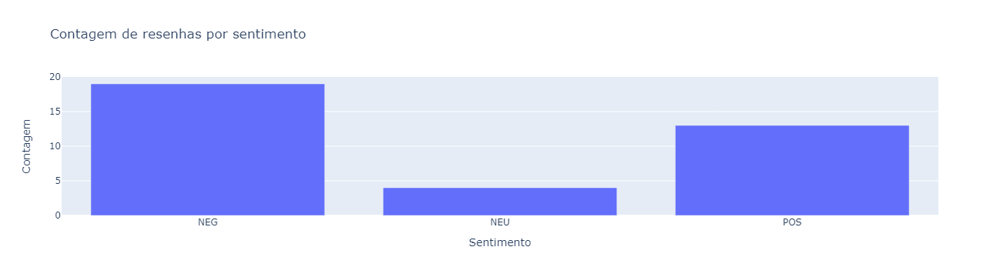

In [14]:
fig = px.bar(df_sentimento, x = "Sentimento", y = "Contagem",
            title = "Contagem de resenhas por sentimento")
fig.show()

In [15]:
import nltk
from nltk.corpus import stopwords

nltk.download( "stopwords" )
portuguese_stopwords = list(set(stopwords.words("portuguese")))
portuguese_stopwords[:10]

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Pichau\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['foi',
 'fôssemos',
 'teu',
 'estar',
 'essa',
 'vos',
 'terá',
 'pelos',
 'para',
 'meu']

In [16]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def nuvem_palavras(texto, coluna_texto, sentimento):
    # Filtrando as resenhas com base no sentimento especificado
    texto_sentimento = texto.query(f"Sentimento == '{sentimento}'")[coluna_texto]

    # Unindo todas as resenhas em uma única string
    texto_unido = " ".join(texto_sentimento)

    # Dividindo o texto em palavras e filtrando com stopwords
    palavras = texto_unido.split()
    palavras_filtradas = [palavra for palavra in palavras if palavra not in portuguese_stopwords]
    texto_filtrado = " ".join(palavras_filtradas)

    # Criando e exibindo a nuvem de palavras
    nuvem_palavras = WordCloud(width=800, height=500, max_words=50).generate(texto_filtrado)
    plt.figure(figsize=(10, 7))
    plt.imshow(nuvem_palavras, interpolation='bilinear')
    plt.axis('off')
    plt.show()



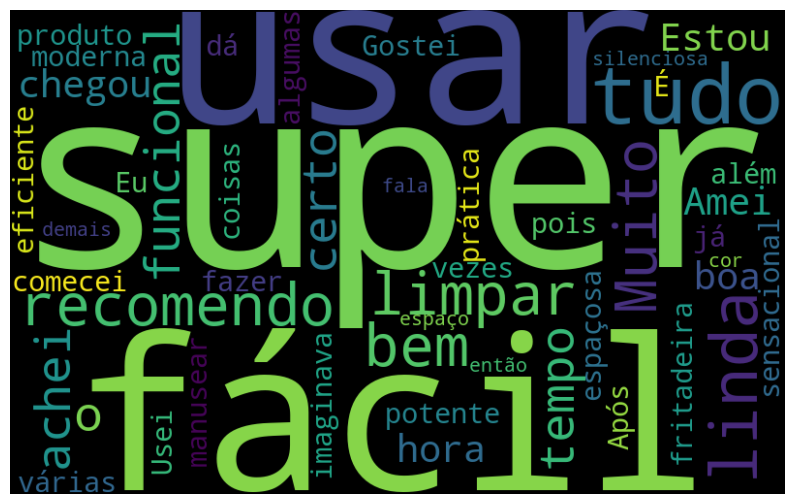

In [17]:
nuvem_palavras(resenhas, "Resenha", "POS")

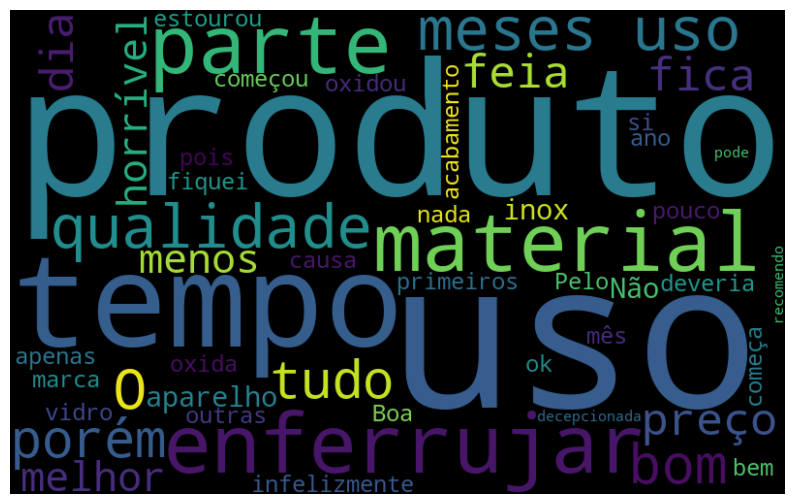

In [18]:
nuvem_palavras(resenhas, "Resenha", "NEG")

# Categorização de produtos

In [19]:
classificador = pipeline( "zero-shot-classification",  model = "facebook/bart-large-mnli") 

C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.



In [20]:
categorias = ["eletronics", "food", "toys", "books"]

In [21]:
predicao = classificador('''Latest model of smartphone with 5G connectivity and 128GB internal storage''', candidate_labels=categorias)
predicao

{'sequence': 'Latest model of smartphone with 5G connectivity and 128GB internal storage',
 'labels': ['eletronics', 'toys', 'food', 'books'],
 'scores': [0.8146152496337891,
  0.06421388685703278,
  0.061535321176052094,
  0.05963550880551338]}

## Modelo em português

In [22]:
from liqfit.pipeline import ZeroShotClassificationPipeline
from liqfit.models import T5ForZeroShotClassification
from transformers import T5Tokenizer

model = T5ForZeroShotClassification.from_pretrained('knowledgator/comprehend_it-multilingual-t5-base')
tokenizer = T5Tokenizer.from_pretrained('knowledgator/comprehend_it-multilingual-t5-base')
classifier = ZeroShotClassificationPipeline(model=model, tokenizer=tokenizer,
                                                      hypothesis_template = '{}', encoder_decoder = True)


In [23]:
descricao = '''Este water gel leve e refrescante, proporciona hidratação imediata que ajuda a aliviar o repuxamento e aspereza da pele sensível.'''
categorias_candidatas = ["beleza", "cozinha", "livros"]
resultado = classifier(descricao, categorias_candidatas, multi_label = False)
resultado

{'sequence': 'Este water gel leve e refrescante, proporciona hidratação imediata que ajuda a aliviar o repuxamento e aspereza da pele sensível.',
 'labels': ['beleza', 'livros', 'cozinha'],
 'scores': [0.9386341571807861, 0.04146726056933403, 0.01989862695336342]}

In [24]:
descricao = '''A fritadeira eletrica sem óleo start fry da elgin possui um design unico, capacidade para até 3,5 litros,
            potência de 1400w e revestimento antiaderente. Seu sistema de circulação de ar ultra rápido frita e economiza energia.
            Sua grelha de fritura é removível e super fácil de limpar. Ela conta com uma proteção contra super aquecimento.
            Possui controle de temperatura de 80°c a 200°c que permite você programar a temperatura de preparo para cada tipo de alimento,
            timer para até 60 minutos com aviso sonoro e desligamento automático, assim você pode deixar preparando sua refeição
            enquanto realiza outras tarefas.'''

categorias_candidatas = ['beleza', 'cozinha', 'livros']
resultado = classifier(descricao, categorias_candidatas, multi_label=False)
resultado = pd.DataFrame(resultado).drop(["sequence"], axis=1)
resultado

,labels,scores
0,cozinha,0.712628
1,beleza,0.236710
2,livros,0.050662


In [25]:
dados = pd.read_csv("dados/descricoes_produtos.csv")
dados.head()

,Descrição
0,Liquidificador de alta potência com jarra de v...
1,"Forno Micro-ondas de 20 litros, com menu desco..."
2,Máquina de café espresso com reservatório de á...
3,Torradeira com capacidade para quatro fatias e...
4,"Panela elétrica multifuncional que cozinha, as..."


In [26]:
categorias = ["eletrodomésticos", "eletrônicos", "beleza", "brinquedos"]
def categorizar(descricao):
    resultado = classifier(descricao, categorias, multi_label = False)
    return resultado["labels"][np.argmax(resultado["scores"])]

categorizar(dados.iloc[13])

C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\liqfit\pipeline\inference.py:263: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



'beleza'

In [27]:
dados["Categoria"] = dados["Descrição"].apply(categorizar)
dados

,Descrição,Categoria
0,Liquidificador de alta potência com jarra de v...,eletrodomésticos
1,"Forno Micro-ondas de 20 litros, com menu desco...",eletrodomésticos
2,Máquina de café espresso com reservatório de á...,eletrodomésticos
3,Torradeira com capacidade para quatro fatias e...,eletrodomésticos
4,"Panela elétrica multifuncional que cozinha, as...",eletrodomésticos
5,Smartphone com 128GB de armazenamento e câmera...,eletrônicos
6,"Smartwatch monitoramento de passos, frequência...",eletrônicos
7,Notebook gamer com placa de vídeo potente e te...,eletrônicos
8,"Smartphone com tela super retina XDR de 6,7 po...",eletrônicos
9,Câmera digital com zoom óptico de 20x e vídeos...,eletrônicos


# Edição de imagens (remoção de backgrounds)

## Girafa

In [28]:
from transformers import pipeline
image_path = "https://farm5.staticflickr.com/4007/4322154488_997e69e4cf_z.jpg"
pipe = pipeline("image-segmentation", model="briaai/RMBG-1.4", trust_remote_code=True)
pillow_mask = pipe(image_path, return_mask = True) # outputs a pillow mask
pillow_image = pipe(image_path) # applies mask on input and returns a pillow image


C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.

C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.



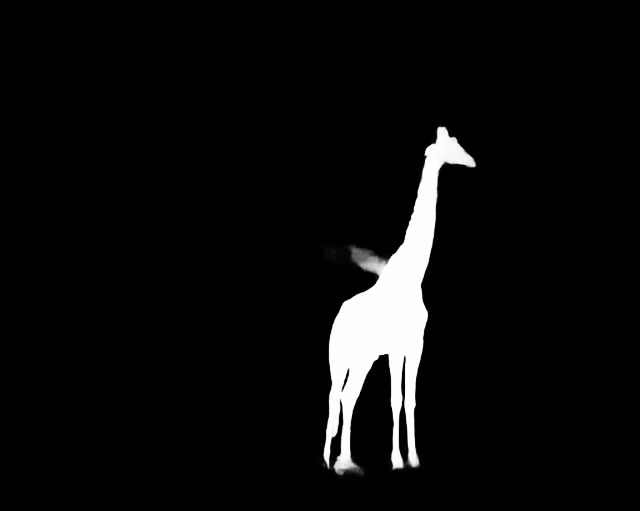

In [29]:
pillow_mask

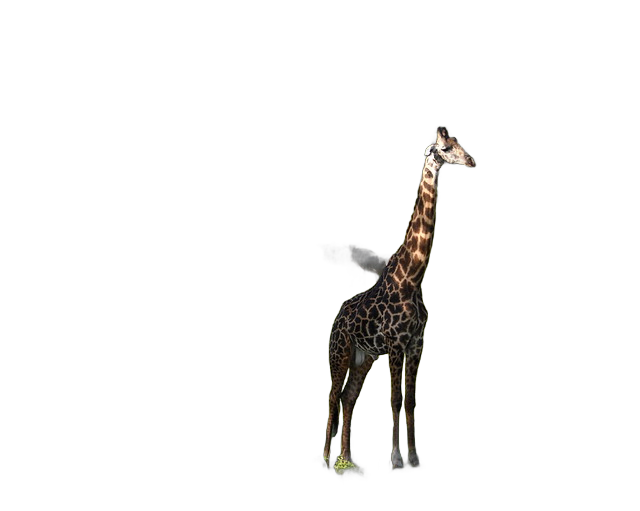

In [30]:
pillow_image

## Câmera

In [31]:
from transformers import pipeline
image_path = "imagens/camera_fotografica.jpg"
pipe = pipeline("image-segmentation", model="briaai/RMBG-1.4", trust_remote_code=True)
pillow_mask = pipe(image_path, return_mask = True) # outputs a pillow mask
pillow_image = pipe(image_path) # applies mask on input and returns a pillow image


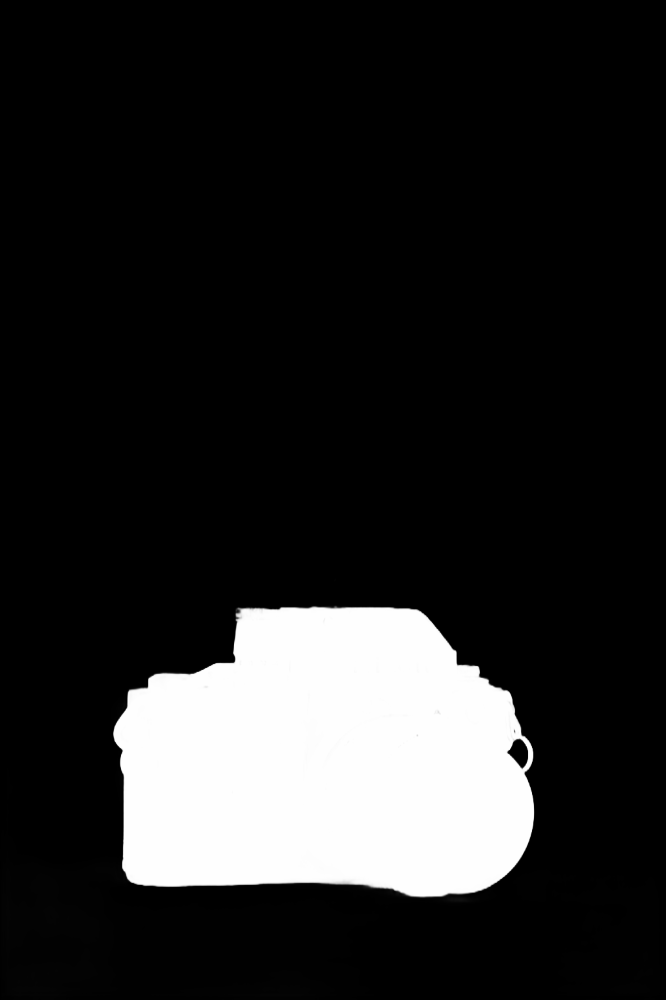

In [32]:
pillow_mask

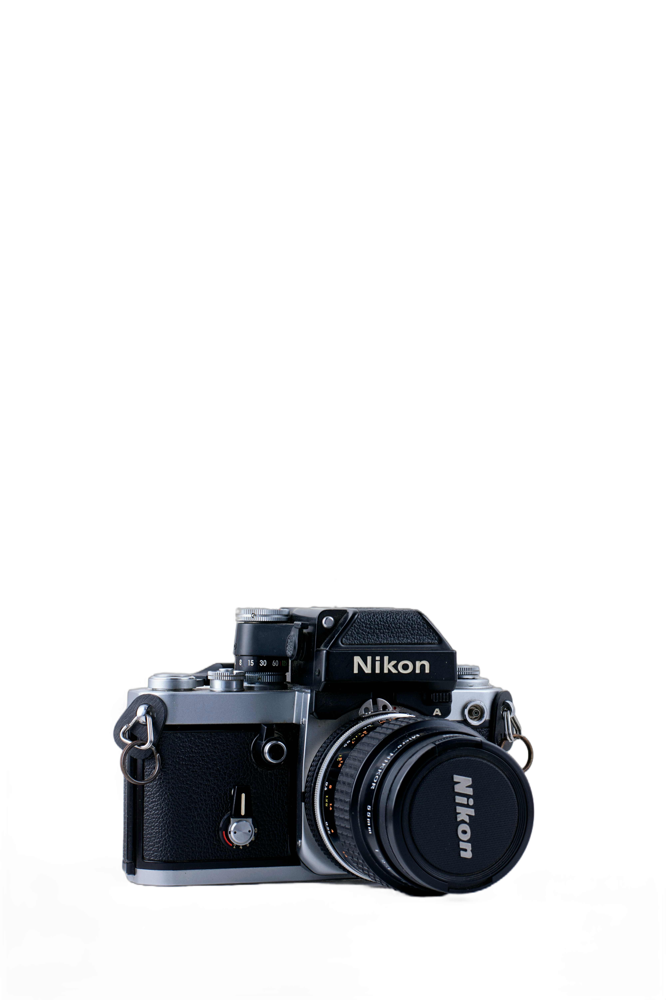

In [33]:
pillow_image

## Usando Gradio

In [34]:
import gradio as gr
from PIL import Image

def remove_background(image):
    pipe = pipeline("image-segmentation", model = "briaai/RMBG-1.4", trust_remote_code = True)
    pillow_mask = pipe(image, return_mask = True)
    pillow_image = pipe(image)
    return pillow_image

app = gr.Interface(
    fn = remove_background,
    inputs = gr.components.Image( type = "pil" ),
    outputs = gr.components.Image( type = "pil" , format = "png"),
    title = "Remoção de background de imagens",
    description = "Envie uma imagem e veja o background removido automaticamente. A imagem resultante será no formato png"
)

app.launch(share = True)

* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://c68da76dedf74f893b.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# Respondendo perguntas

In [35]:
QA_modelo = pipeline("question-answering", model = "deepset/roberta-base-squad2")

C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.



In [36]:
def obter_resposta(pergunta, contexto):
    return QA_modelo( question = pergunta, context = contexto )

In [37]:
pergunta = 'What are the payment options available?'
contexto = 'In our e-commerce, you can make payments using credit card, debit card, Apple Pay, or through bank transfers.'

resposta = obter_resposta(pergunta, contexto)
resposta

{'score': 0.8174911141395569,
 'start': 47,
 'end': 108,
 'answer': 'credit card, debit card, Apple Pay, or through bank transfers'}

In [38]:
contextos = {
    "How do I create an account?": "You can create an account by clicking on the 'Sign Up' button on our homepage. You will need to provide your email address, create a password, and fill in some basic information about yourself. An account will help you track your orders, manage your personal settings, and speed up future transactions.",
    "Which payment methods do you accept?": "We accept a wide range of payment methods including Visa, MasterCard, American Express, Discover, PayPal, and Apple Pay. You can also pay using store credit or gift cards issued by our company.",
    "How can I track my order?": "Once your order has shipped, you will receive an email with a tracking number. You can use this number on our website's tracking page to see the current status of your delivery.",
    "Do you offer international shipping?": "Yes, we offer international shipping to most countries. Shipping costs and delivery times vary depending on the destination. All applicable customs fees, taxes, and duties are the responsibility of the customer and are calculated at checkout.",
    "How long does delivery take?": "For standard shipping, deliveries typically take between 3 to 5 business days. For expedited shipping, expect your order to arrive within 1 to 2 business days. Delivery times may vary based on your location and the time of the year.",
    "What is your return policy?": "Our return policy allows you to return products within 30 days of receiving them. Items must be in their original condition and packaging. Some items, such as perishable goods, are not eligible for return.",
    "Can I change or cancel my order after it's been placed?": "You can change or cancel your order within 24 hours of placing it without any additional charge.To make changes or cancel your order, please contact our customer service immediately.",
    "What should I do if I receive a damaged item?": "If you receive a damaged item, please contact our customer service within 48 hours of delivery to report the damage. You will need to provide your order number, the description of the damage, and photographic evidence. We will arrange for a replacement or refund as appropriate.",
    "How do I reset my password?": "If you've forgotten your password, go to the login page and click on 'Forgot Password'. Enter your email address and we will send you a link to reset your password. For security purposes, this link will expire within 24 hours."
}


In [39]:
def respondendo_faq(pergunta):
    contexto = contextos[pergunta]
    resultado = QA_modelo(question = pergunta, context = contexto)
    return resultado["answer"]



In [40]:
respondendo_faq("How do I create an account?")

"by clicking on the 'Sign Up' button on our homepage"

In [41]:
respondendo_faq("Which payment methods do you accept?")

'Visa, MasterCard, American Express, Discover, PayPal, and Apple Pay'

In [42]:
respondendo_faq("Do you offer international shipping?")

'we offer international shipping to most countries'

In [43]:
respondendo_faq("Can I change or cancel my order after it's been placed?")

'You can change or cancel your order within 24 hours'

## Interface com Gradio

In [44]:
app = gr.Interface(
    fn = respondendo_faq,
    inputs = gr.Dropdown( choices = list(contextos.keys()), label = "Select your question" ),
    outputs = "text",
    title = "E-commerce FAQ",
    description = "Select a question to get an asnwer from our FAQ"
)

app.launch(share = True)

* Running on local URL:  http://127.0.0.1:7861
* Running on public URL: https://71aab3a0dfc2e901e3.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# Chatbot

In [45]:
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch


tokenizer = AutoTokenizer.from_pretrained("microsoft/DialoGPT-medium")
model = AutoModelForCausalLM.from_pretrained("microsoft/DialoGPT-medium")


C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.



In [46]:
# Let's chat for 5 lines
for step in range(5):
    # encode the new user input, add the eos_token and return a tensor in Pytorch
    new_user_input_ids = tokenizer.encode(input(">> User:") + tokenizer.eos_token, return_tensors='pt')

    # append the new user input tokens to the chat history
    bot_input_ids = torch.cat([chat_history_ids, new_user_input_ids], dim=-1) if step > 0 else new_user_input_ids

    # generated a response while limiting the total chat history to 1000 tokens, 
    chat_history_ids = model.generate(bot_input_ids, max_length=1000, pad_token_id=tokenizer.eos_token_id)

    # pretty print last ouput tokens from bot
    print("DialoGPT: {}".format(tokenizer.decode(chat_history_ids[:, bot_input_ids.shape[-1]:][0], skip_special_tokens=True)))

>> User: 


DialoGPT: 


>> User: 


DialoGPT: 


>> User: 


DialoGPT: 


>> User: 


DialoGPT: 


>> User: 


DialoGPT: 


In [47]:
dados_pedidos = {
    "numero_pedido": ["12345", "67890", "11121", "22232"],
    "status": ["Shipped", "Processing", "Delivered", "Cancelled"]
}

df_status_pedidos = pd.DataFrame(dados_pedidos)
df_status_pedidos

,numero_pedido,status
0,12345,Shipped
1,67890,Processing
2,11121,Delivered
3,22232,Cancelled


In [48]:
def consultar_pedido(numero_pedido):
    presente = numero_pedido in list(df_status_pedidos["numero_pedido"])
    if presente:
        status =  df_status_pedidos[ df_status_pedidos["numero_pedido"] == numero_pedido ]["status"].iloc[0]
        return "The status of your order {} is {}.".format(numero_pedido, status)
    else:
        return "Order number not found. Please check and try again."

consultar_pedido("12344")

'Order number not found. Please check and try again.'

In [49]:
palavras_chave_status = ["order", "order status", "status of my order", "check my order", "track my order", "order update"]

In [50]:
ids_historico_chat = None
while True:
    input_usuario = input("User: ")
    if input_usuario.lower() in ["exit", "quit", "stop"]:
        print("Bot: Goodbye!")
        break

    if any(keyword in input_usuario.lower() for keyword in palavras_chave_status):
        numero_pedido = input("Please enter your order number: ")
        resposta = consultar_pedido(numero_pedido)
    else:
        novo_usuario_input_ids = tokenizer.encode( input_usuario + tokenizer.eos_token, return_tensors = "pt")
        if ids_historico_chat is not None:
            bot_input_ids = torch.cat( [ids_historico_chat, novo_usuario_input_ids], dim = -1 )

        else:
            bot_input_ids = novo_usuario_input_ids
    
        ids_historico_chat = model.generate(
            bot_input_ids, 
            max_length = 1000,
            pad_token_id = tokenizer.eos_token_id
        )
        resposta = tokenizer.decode( ids_historico_chat[:, bot_input_ids.shape[-1]:][0], skip_special_tokens = True )
    print(f'Bot: {resposta}')

User:  quit


Bot: Goodbye!


## Interface com Gradio

In [51]:
tokenizer = AutoTokenizer.from_pretrained("microsoft/DialoGPT-medium")
model = AutoModelForCausalLM.from_pretrained("microsoft/DialoGPT-medium")

dados_pedidos = {
    "numero_pedido": ["12345", "67890", "11121", "22232"],
    "status": ["Shipped", "Processing", "Delivered", "Cancelled"]
}

df_status_pedidos = pd.DataFrame(dados_pedidos)
palavras_chave_status = ["order", "order status", "status of my order", "check my order", "track my order", "order update"]

def responder(input_usuario, ids_historico_chat):
    if any(keyword in input_usuario.lower() for keyword in palavras_chave_status):
        return "Please enter your order number: ", ids_historico_chat
    else:
        novo_usuario_input_ids = tokenizer.encode( input_usuario + tokenizer.eos_token, return_tensors = "pt")
        if ids_historico_chat is not None:
            bot_input_ids = torch.cat( [ids_historico_chat, novo_usuario_input_ids], dim = -1 )

        else:
            bot_input_ids = novo_usuario_input_ids
    
        ids_historico_chat = model.generate(
            bot_input_ids, 
            max_length = 1000,
            pad_token_id = tokenizer.eos_token_id
        )
        resposta = tokenizer.decode( ids_historico_chat[:, bot_input_ids.shape[-1]:][0], skip_special_tokens = True )
    
    return resposta, ids_historico_chat

with gr.Blocks() as app:
    chatbot = gr.Chatbot()
    msg = gr.Text(placeholder = "Type your message here...")

    estado = gr.State( None )
    aguardando_numero_pedido = gr.State( False )

    def processar_entrada( input_usuario, historico, ids_historico_chat, aguardando_numero_pedido ):
        if aguardando_numero_pedido:
            resposta = consultar_pedido( input_usuario )
            aguardando_numero_pedido = False
        else:
            resposta, ids_historico_chat = responder( input_usuario, ids_historico_chat )
            if resposta == "Please enter your order number: ":
                aguardando_numero_pedido = True

        historico.append( (input_usuario, resposta) )
        return historico, ids_historico_chat, aguardando_numero_pedido, ""

    msg.submit(
        processar_entrada,
        [msg, chatbot, estado, aguardando_numero_pedido], # Valores de entrada
        [chatbot, estado, aguardando_numero_pedido, msg] # Valores de saída que vão ser atualizados
    )
    app.launch(share = True)

C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning:

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.

C:\Users\Pichau\AppData\Local\Programs\Python\Python311\Lib\site-packages\gradio\components\chatbot.py:222: UserWarning:

You have not specified a value for the `type` parameter. Defaulting to the 'tuples' format for chatbot messages, but this is deprecated and will be removed in a future version of Gradio. Please set type='messages' instead, which uses openai-style 'role' and 'content' keys.



* Running on local URL:  http://127.0.0.1:7862
* Running on public URL: https://581c9eb30dce357d3e.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


## Tentando um Chatbot mais avançado

In [55]:
# Let's chat for 5 lines
for step in range(5):
    # encode the new user input, add the eos_token and return a tensor in Pytorch
    new_user_input_ids = tokenizer.encode(input(">> User:") + tokenizer.eos_token, return_tensors='pt')

    # append the new user input tokens to the chat history
    bot_input_ids = torch.cat([chat_history_ids, new_user_input_ids], dim=-1) if step > 0 else new_user_input_ids

    # generated a response while limiting the total chat history to 1000 tokens, 
    chat_history_ids = model.generate(bot_input_ids, max_length=1000, pad_token_id=tokenizer.eos_token_id)

    # pretty print last ouput tokens from bot
    print("DialoGPT: {}".format(tokenizer.decode(chat_history_ids[:, bot_input_ids.shape[-1]:][0], skip_special_tokens=True)))

>> User: Hi


DialoGPT: Hi! :D


KeyboardInterrupt: Interrupted by user

In [81]:
texto = "I need to know my order status"
have_order_id = obter_resposta("Is there any order ID?", texto + " yes no")
order_id_check = obter_resposta("What is the order ID provided?", texto)
print(have_order_id)
print(order_id_check)

{'score': 8.022112160688266e-05, 'start': 31, 'end': 37, 'answer': 'yes no'}
{'score': 4.2254127947671805e-06, 'start': 18, 'end': 30, 'answer': 'order status'}


In [ ]:
["order", "order status", "status of my order", "check my order", "track my order", "order update"]